In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

from matplotlib import animation, rc
from IPython.display import HTML

from PIL import Image
import glob

In [2]:
def cv2_imshow(img):
    plt.rcParams['figure.figsize'] = [10, 10]
    plt.imshow(img, cmap = 'gray', interpolation = 'bicubic')
    plt.axis("off")
    plt.show()
    
def draw_flow(img, flow, step=16):
    h, w = img.shape[:2]
    y, x = np.mgrid[step/2:h:step, step/2:w:step].reshape(2,-1).astype(int)
    fx, fy = flow[y,x].T
    lines = np.vstack([x, y, x+fx, y+fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines + 0.5)
    vis = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
    cv.polylines(vis, lines, 0, (0, 255, 0))
    for (x1, y1), (_x2, _y2) in lines:
        cv.circle(vis, (x1, y1), 1, (0, 255, 0), -1)
    return vis

### command line parametes

In [3]:
# track = [73,126,29,23] # bound box of the object to track
# dataset_name = 'CarDark'
# image_src = 'data/{}/img/*.jpg'.format(dataset_name)

In [4]:
# track = [70,51,107,87] # bound box of the object to track
# dataset_name = 'Car4'
# image_src = 'data/{}/img/*.jpg'.format(dataset_name)

In [5]:
track = [23,88,66,55] # bound box of the object to track
dataset_name = 'Car1'
image_src = 'data/{}/img/*.jpg'.format(dataset_name)

500
['data/Car1/img/0001.jpg', 'data/Car1/img/0002.jpg', 'data/Car1/img/0003.jpg', 'data/Car1/img/0004.jpg', 'data/Car1/img/0005.jpg']


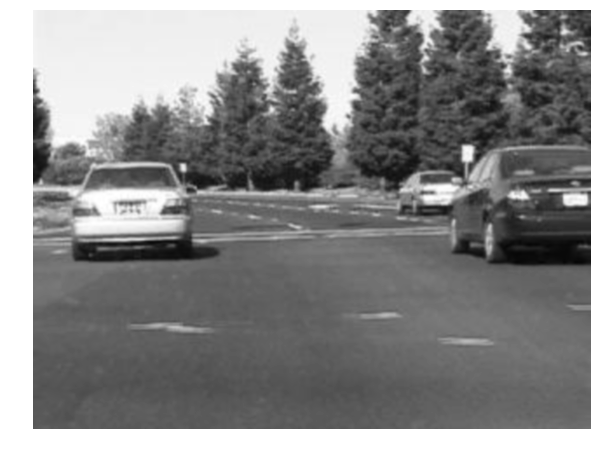

In [6]:
image_list = []
# files = glob.iglob('data/Car1/img/*.jpg')
# for i in range(500):
#     image_list.append(next(files))
    
    
for file in sorted(glob.glob(image_src)):
    image_list.append(file)

    
print(len(image_list))
print(image_list[0:5])

img = cv.imread(image_list[0],0)
cv2_imshow(img)

###  Lucas Kanade

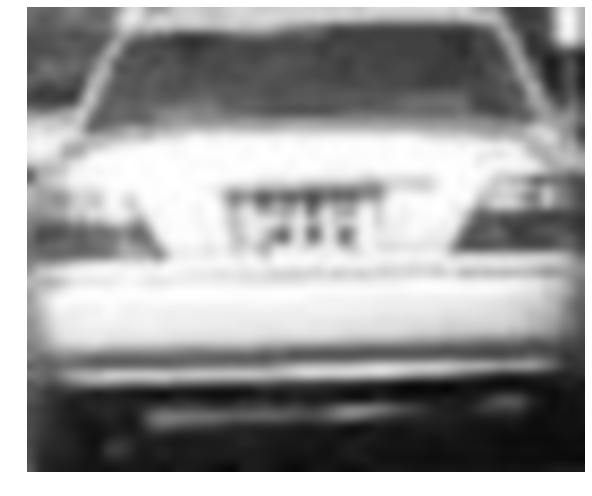

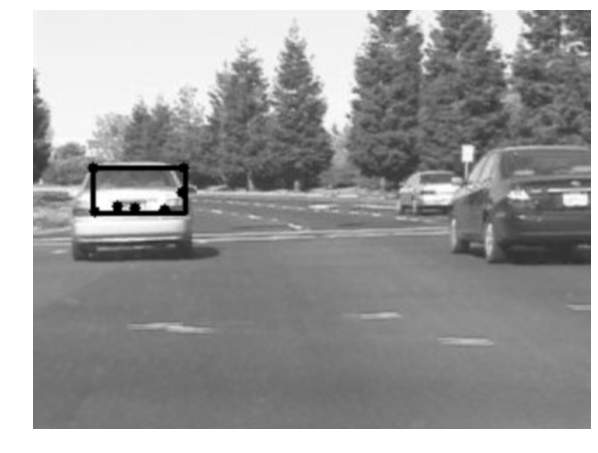

In [7]:
gray1 = cv.imread(image_list[0],0)
gray2 = cv.imread(image_list[1],0)

points_to_track = []
for i in range(track[1], track[1]+track[3]):
    for j in range(track[0], track[0] + track[2]):
        points_to_track.append((i,j))
points_to_track = np.array(points_to_track, dtype=np.float32)

car = gray2[track[1]:track[1]+track[3], track[0]:track[0]+track[2]]
cv2_imshow(car)


#--
# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )
mask = np.zeros_like(gray1)
mask[track[1]:track[1]+track[3], track[0]:track[0]+track[2]].fill(1)

p0 = cv.goodFeaturesToTrack(gray1, mask = mask, **feature_params)
#--

features_img = np.copy(gray1)
for i in p0:
    x,y = i.ravel()
    cv.circle(features_img,(x,y),3,0,-1)
    
x,y,w,h = cv.boundingRect(p0)
cv.rectangle(features_img,(x,y),(x+w,y+h),(0,255,0),2)
       
cv2_imshow(features_img)

To improve https://github.com/opencv/opencv/blob/master/samples/python/lk_homography.py

DONE


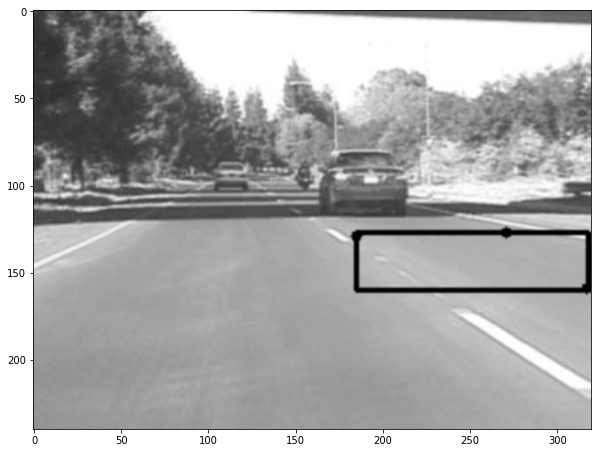

In [8]:
fig = plt.figure()
optical_flows = []

# params for Lucas Kanade
lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )


gray1 = cv.imread(image_list[0],0)
mask = np.zeros_like(gray1)
mask[track[1]:track[1]+track[3], track[0]:track[0]+track[2]].fill(1)

# read first image and get initial tracking points
p0 = cv.goodFeaturesToTrack(gray1, mask = mask, **feature_params)
bbox_continues = track
for i in range(len(image_list)):  
    gray1 = cv.imread(image_list[i],0)
    gray2 = cv.imread(image_list[i+1],0) if i+1<len(image_list) else img 
    
    p1, st, err = cv.calcOpticalFlowPyrLK(gray1, gray2, p0, None, **lk_params)
    
    if p1 is None:
        continue
    
    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]
    
    # save for the next iteration
    p0 = good_new.reshape(-1,1,2)
    bbox_continues = cv.boundingRect(p0)
    
    # ------------------------------
    # add more points to track
    # it is bad experiment
    mask = np.zeros_like(gray2)
    mask[bbox_continues[1]-1:bbox_continues[1]+bbox_continues[3]+2, 
         bbox_continues[0]-1:bbox_continues[0]+bbox_continues[2]+2].fill(1)
    p2 = cv.goodFeaturesToTrack(gray2, mask = mask, **feature_params)
    #     if p2 is not None:
    #         p0 = np.concatenate((p0, p2))
    # ------------------------------
    
    # draw rectangle and points
    features_img = np.copy(gray1)
    for i in p0:
        x,y = i.ravel()
        cv.circle(features_img,(x,y),3,0,-1)
    cv.rectangle(features_img,(bbox_continues[0],bbox_continues[1]),
                 (bbox_continues[0]+bbox_continues[2],bbox_continues[1]+bbox_continues[3]),(0,255,0),2)
    
    # save to display on video
    im = plt.imshow(features_img, animated=True, cmap = 'gray', interpolation = 'bicubic')
    optical_flows.append([im])
    
    
print('DONE')

ani = animation.ArtistAnimation(fig, optical_flows, interval=500, blit=True,
                                repeat_delay=1000)

HTML(ani.to_html5_video())

In [9]:
# save video
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)
ani.save('{}.mp4'.format(dataset_name), writer=writer)

## Dense Optical Flow in OpenCV 
### Bad results when we have mooving background (camera is not stable)!

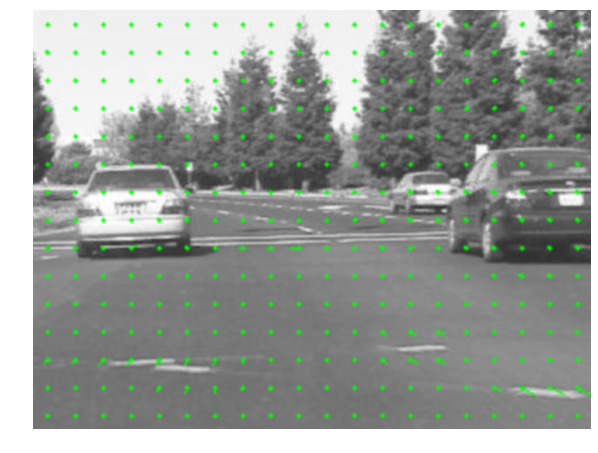

In [10]:
gray1 = cv.imread(image_list[8],0)
gray2 = cv.imread(image_list[9],0)
flow = cv.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
flow_img = draw_flow(np.copy(gray1), flow)

cv2_imshow(flow_img)

DONE


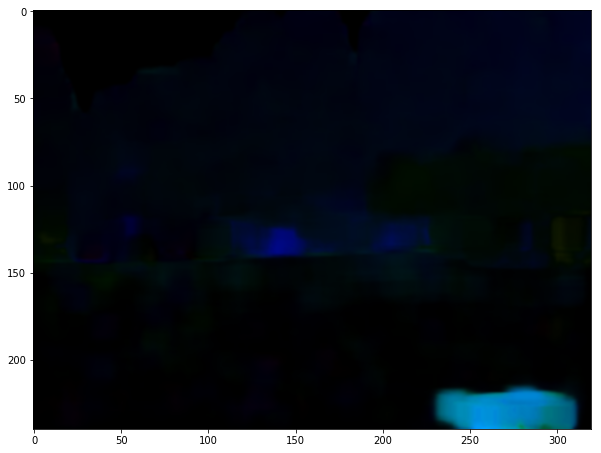

In [11]:
fig = plt.figure()

ims = []
optical_flows = []
for i in range(20):     
    gray1 = cv.imread(image_list[i],0)
    gray2 = cv.imread(image_list[i+1],0) if i+1<len(image_list) else img 
    
    flow = cv.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    
    hsv = np.zeros((gray1.shape[0],gray1.shape[1],3), dtype=np.uint8)
    hsv[...,1] = 255
    mag, ang = cv.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv.normalize(mag,None,0,255,cv.NORM_MINMAX)
    bgr = cv.cvtColor(hsv,cv.COLOR_HSV2BGR)
    
    
    im = plt.imshow(bgr, animated=True, cmap = 'gray', interpolation = 'bicubic')
    optical_flows.append([im])
    
print('DONE')

ani = animation.ArtistAnimation(fig, optical_flows, interval=500, blit=True,
                                repeat_delay=1000)

HTML(ani.to_html5_video())

DONE


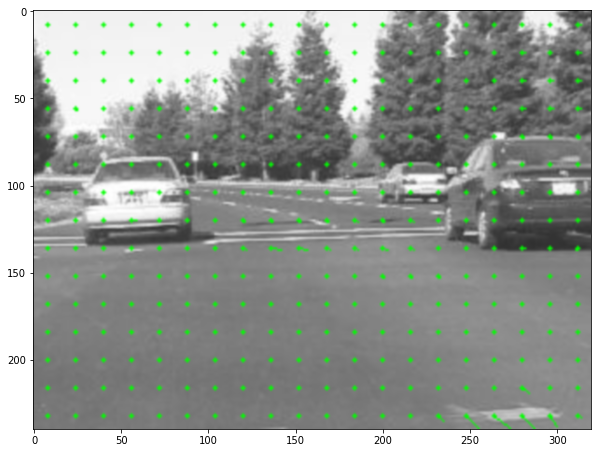

In [12]:
# https://matplotlib.org/2.1.2/gallery/animation/dynamic_image2.html

fig = plt.figure()

ims = []
optical_flows = []
for i in range(20):
    gray1 = cv.imread(image_list[i],0)
    gray2 = cv.imread(image_list[i+1],0) if i+1<len(image_list) else img 
    flow = cv.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    flow_img = draw_flow(np.copy(gray1), flow)
    
    im = plt.imshow(flow_img, animated=True, cmap = 'gray', interpolation = 'bicubic')
    optical_flows.append([im])

print('DONE')

ani = animation.ArtistAnimation(fig, optical_flows, interval=500, blit=True,
                                repeat_delay=1000)

HTML(ani.to_html5_video())